In [1]:
image_path = 'images\img_detection_8.jpg'
template_path = 'images\crop\img_detection_crop_8.jpg'
image_id = int(image_path[:-4].split('_')[-1])

In [2]:
from image_detection import template_matching_cv, template_matching, keypoint_matching, get_annotations, calculate_iou, calculate_rotated_iou, convert_to_4_points
import numpy as np

In [3]:
annotation_path = 'images\\annotation.csv'
ann_map = get_annotations(annotation_path)

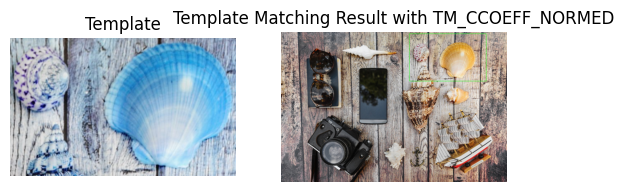

0.7129262278525396

In [4]:
pred_box = template_matching_cv(image_path, template_path)
calculate_iou(pred_box, ann_map.get(image_id))


In [5]:
# pre_box = template_matching(image_path, template_path)
# calculate_iou(pred_box, ann_map.get(image_id))

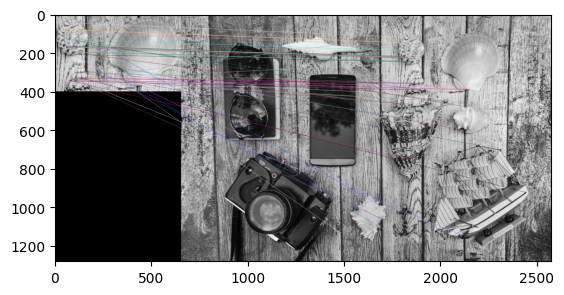

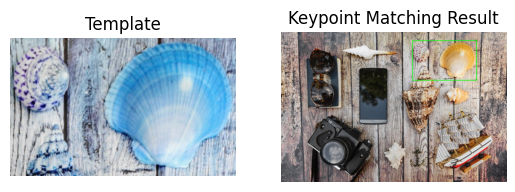

0.901085972655221

In [6]:
pred_box = keypoint_matching(image_path, template_path)
ann_box = convert_to_4_points(ann_map.get(image_id))
calculate_rotated_iou(pred_box, ann_box)

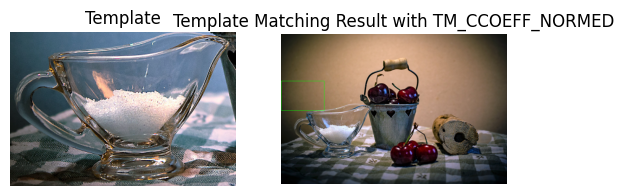

0.054989935529041106


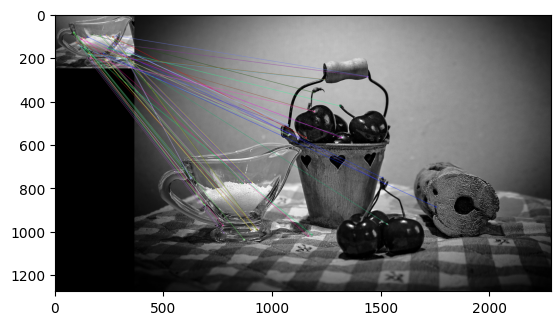

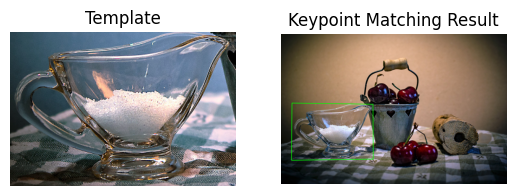

0.9219753558276457


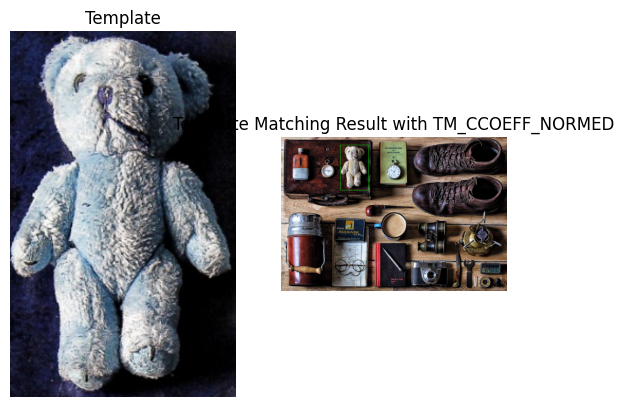

0.898963820953843


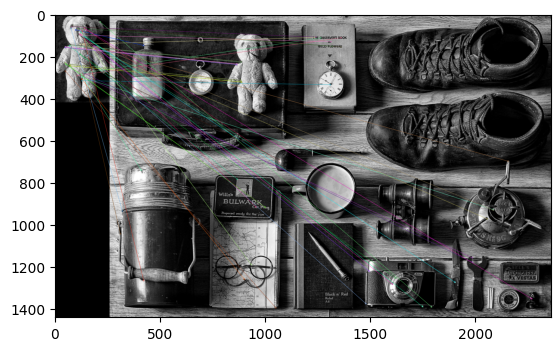

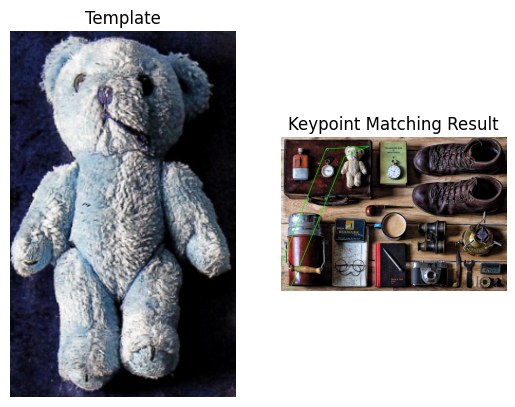

0.013952279237881206


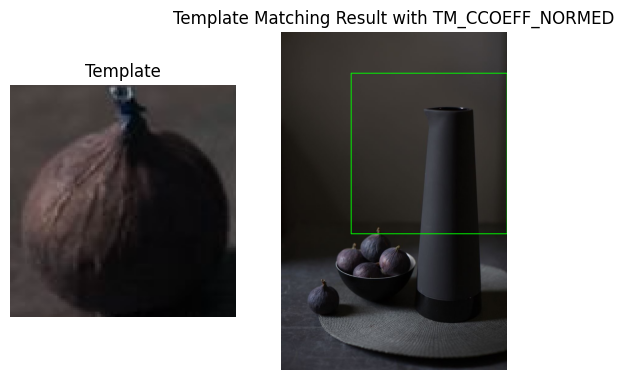

0.0


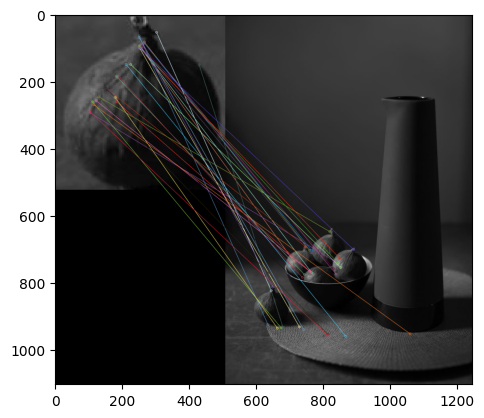

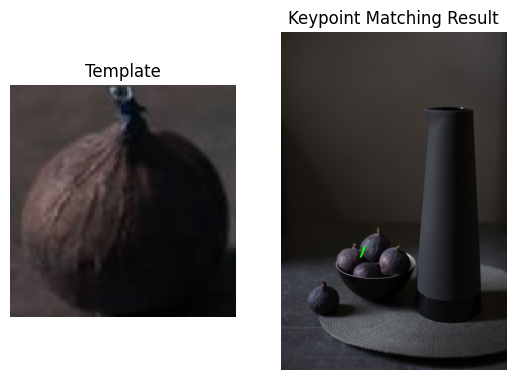

0.0


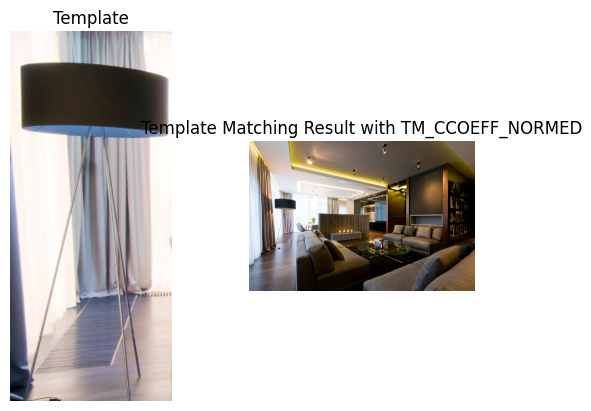

0.0


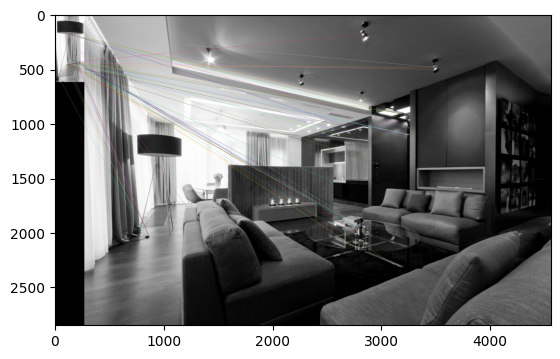

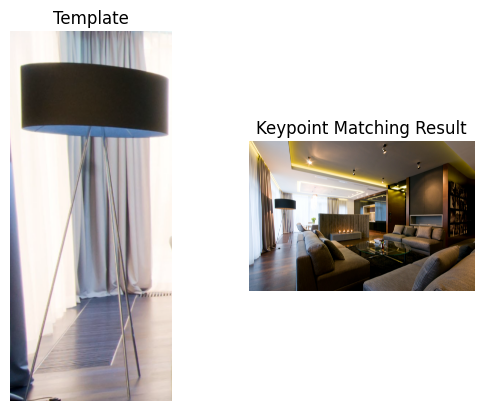

0.0


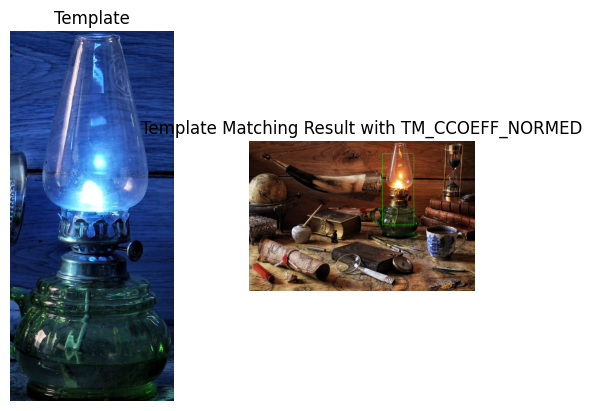

0.5122816073252017


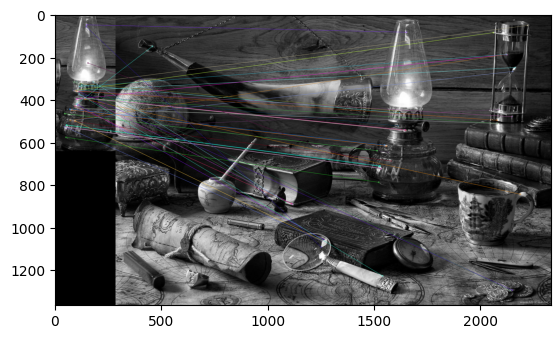

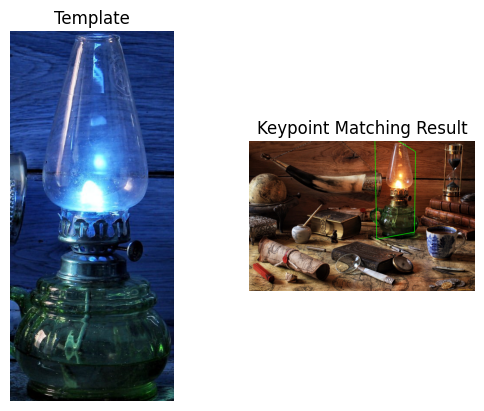

0.7638441214652449


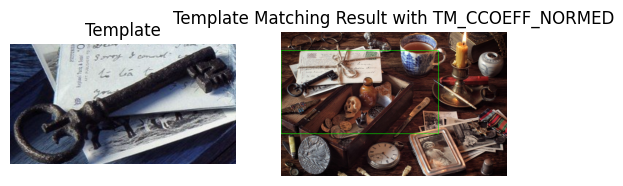

0.11587892408174731


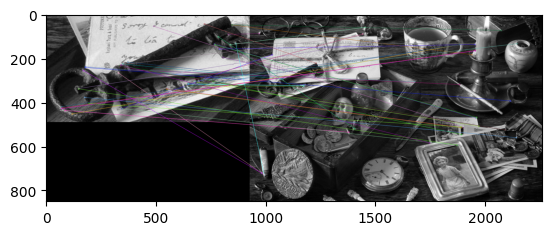

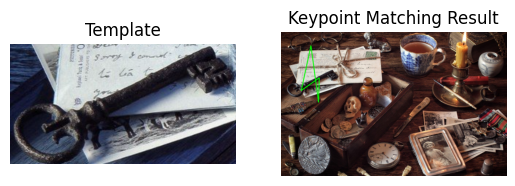

0


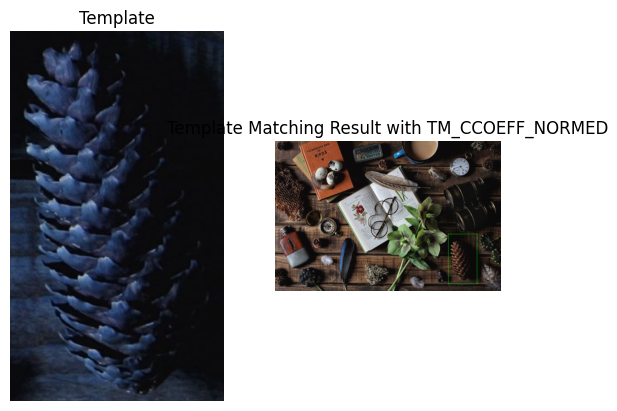

0.7597743629644038


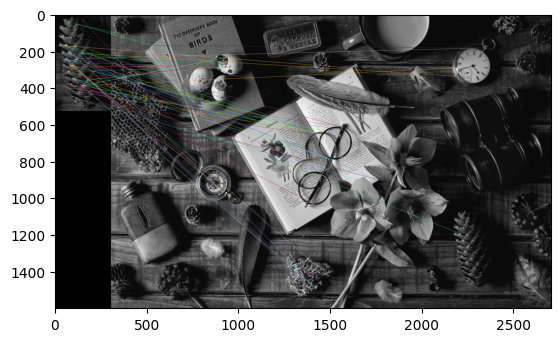

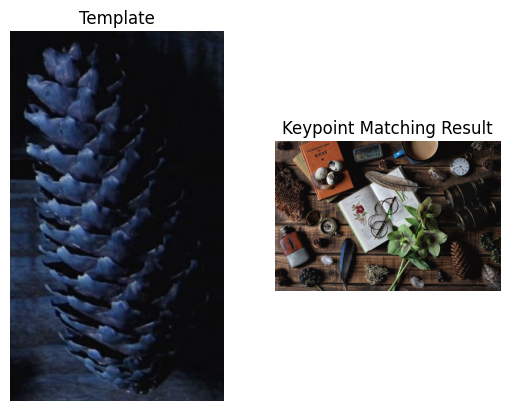

0.0


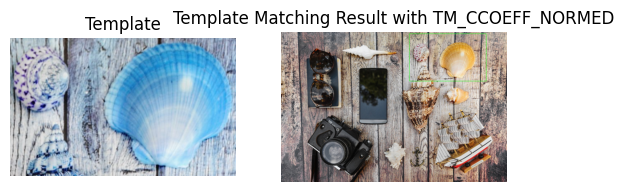

0.7129262278525396


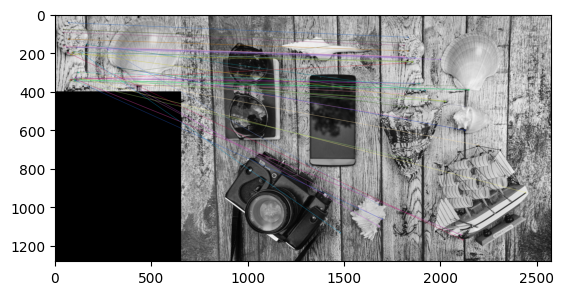

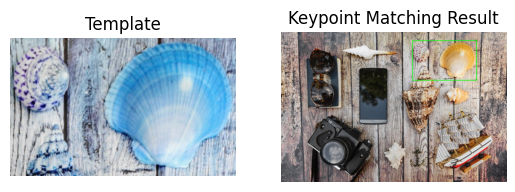

0.901085972655221


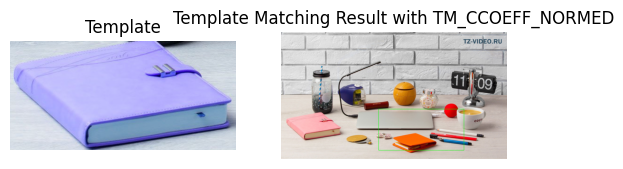

0.0


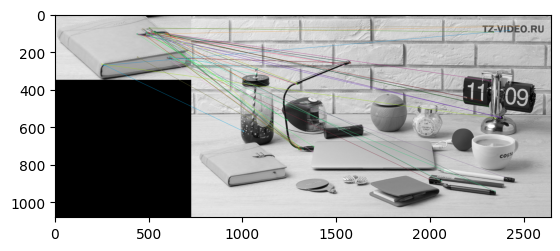

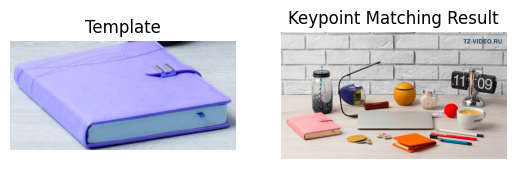

0.0


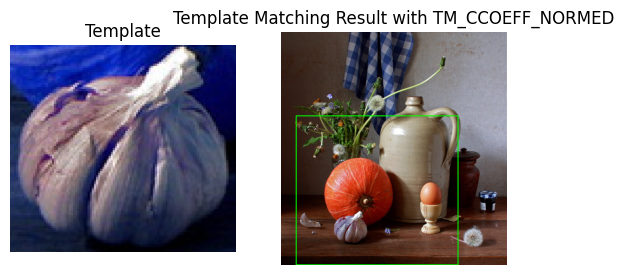

0.0


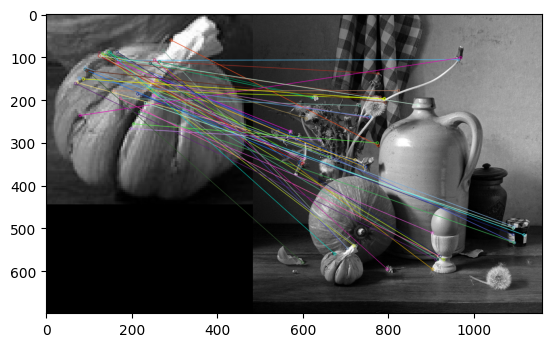

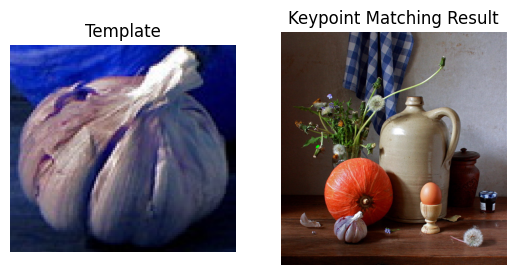

0.0


In [7]:
image_path_template = 'images\\img_detection_?.jpg'
crop_image_path_template = 'images\\crop\\img_detection_crop_?.jpg'
average_iou_template = []
average_iou_keypoint = []

for i in range (1, 11):
    image_path = image_path_template.replace('?', str(i))
    template_path = crop_image_path_template.replace('?', str(i))
    image_id = int(image_path[:-4].split('_')[-1])

    annotation_path = 'images\\annotation.csv'
    ann_map = get_annotations(annotation_path)

    pred_box = template_matching_cv(image_path, template_path)
    iou = calculate_iou(pred_box, ann_map.get(image_id))
    average_iou_template.append(iou)
    print(iou)

    pred_box = keypoint_matching(image_path, template_path)
    ann_box = convert_to_4_points(ann_map.get(image_id))
    iou = calculate_rotated_iou(pred_box, ann_box)
    average_iou_keypoint.append(iou)
    print(iou)

In [8]:
print('Average IoU for template matching:', np.mean(average_iou_template))
print('Average IoU for keypoint matching:', np.mean(average_iou_keypoint))

average_iou_template = np.array(average_iou_template)
average_iou_keypoint = np.array(average_iou_keypoint)
print('Template matching (without zero results):', average_iou_template[average_iou_template != 0].mean())
print('Keypoint matching (without zero results):', average_iou_keypoint[average_iou_keypoint != 0].mean())

print('Template matching (count of zero results):', np.count_nonzero(average_iou_template == 0.0))
print('Keypoint matching (count of zero results):', np.count_nonzero(average_iou_keypoint == 0.0))

Average IoU for template matching: 0.30548148787067764
Average IoU for keypoint matching: 0.2600857729185993
Template matching (without zero results): 0.509135813117796
Keypoint matching (without zero results): 0.6502144322964982
Template matching (count of zero results): 4
Keypoint matching (count of zero results): 6


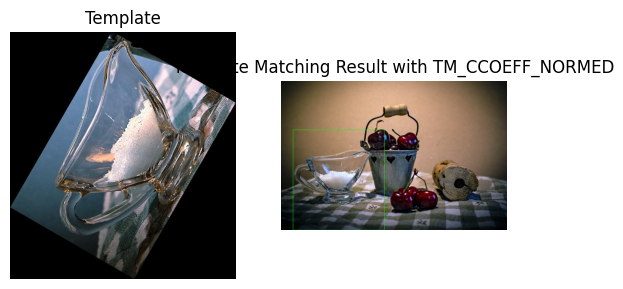

0.4912547517211749


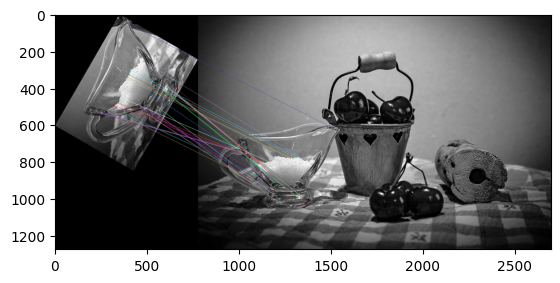

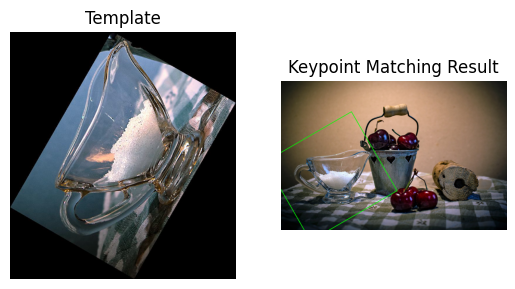

0.5205243177913675


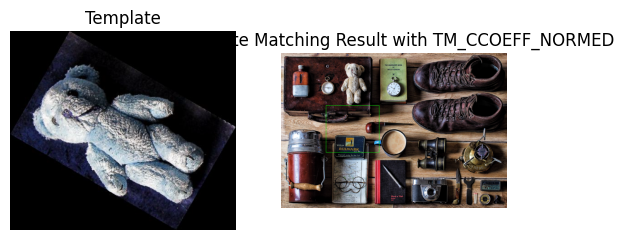

0.004030632809351068


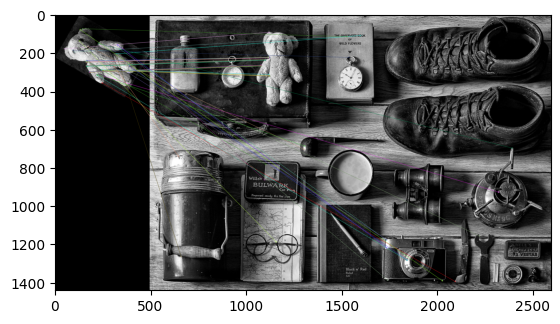

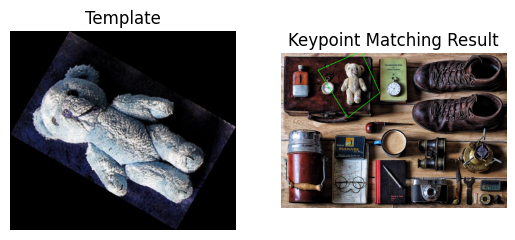

0.5502470522631617


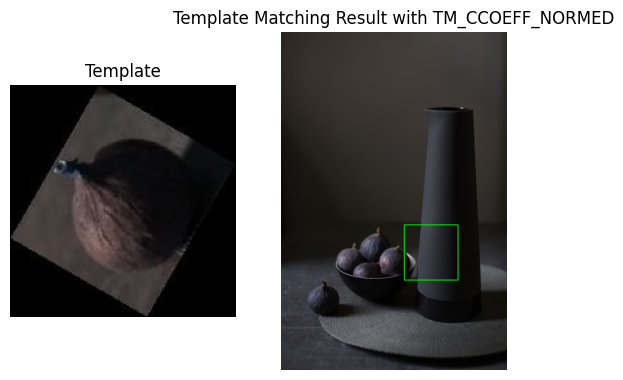

0.0


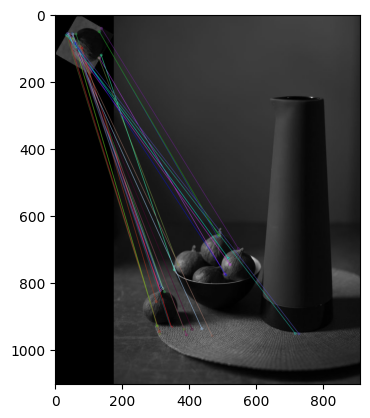

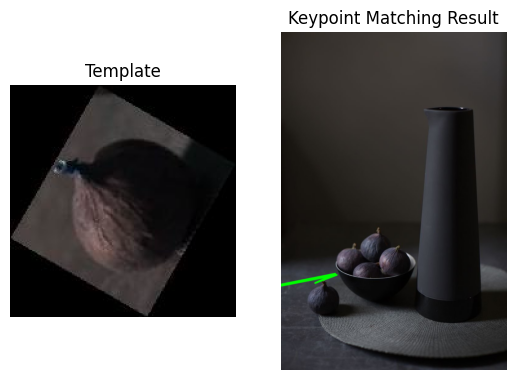

0


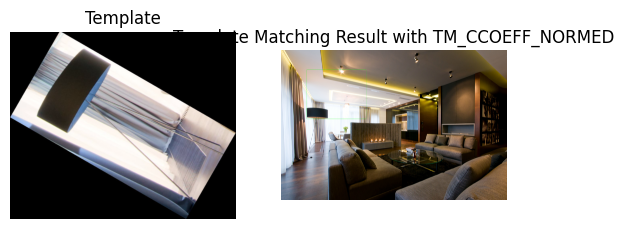

0.09293419163409639


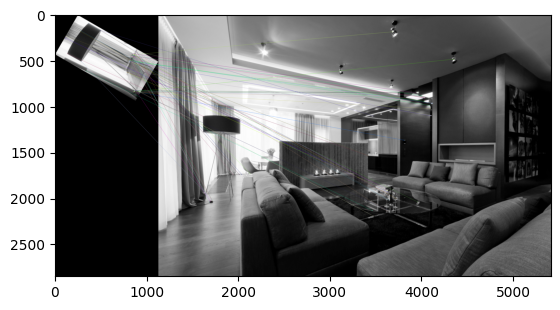

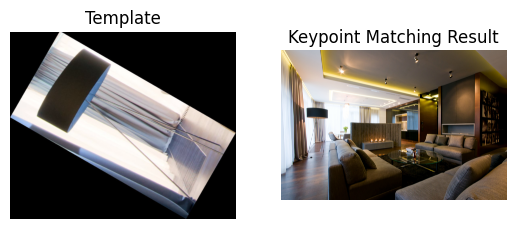

0.0


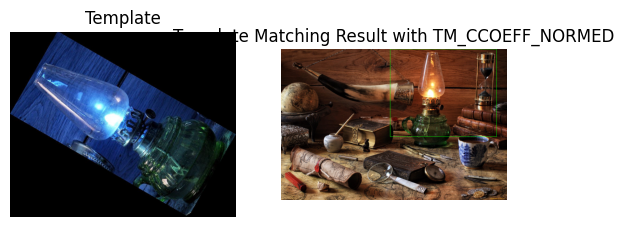

0.39635288221051346


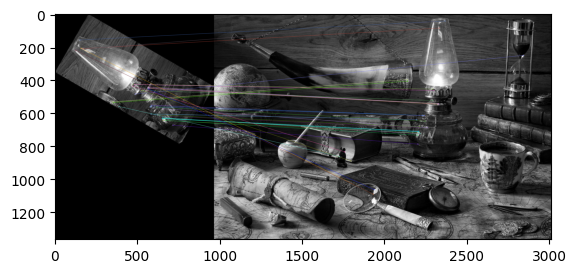

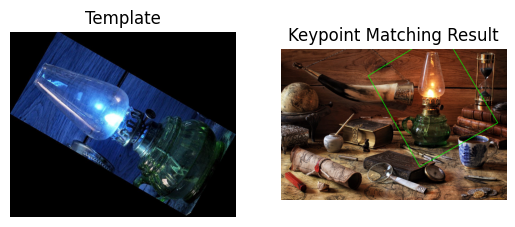

0.46465089074798105


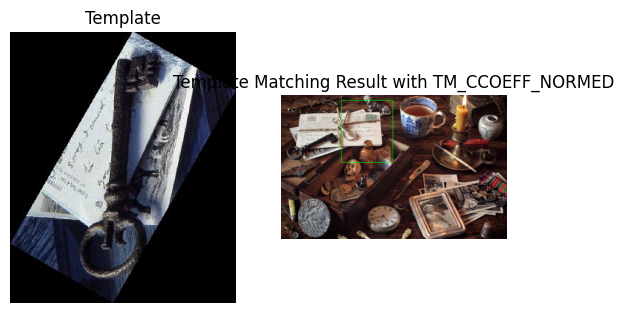

0.0


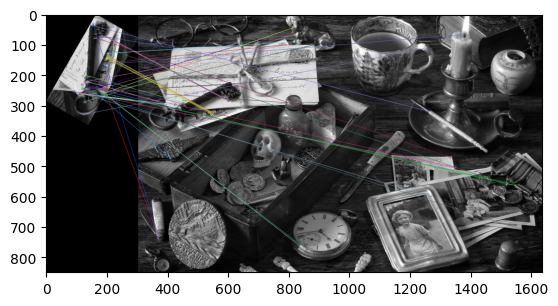

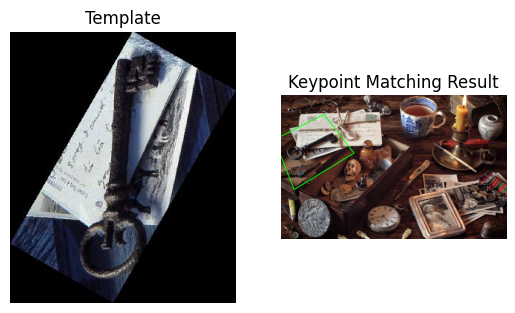

0.4720149768737713


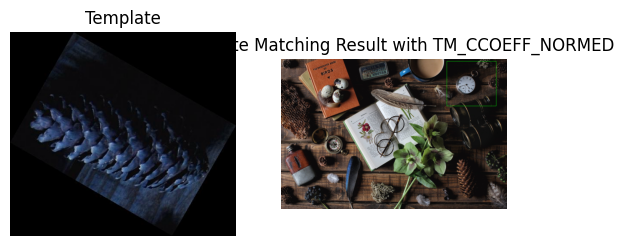

0.0


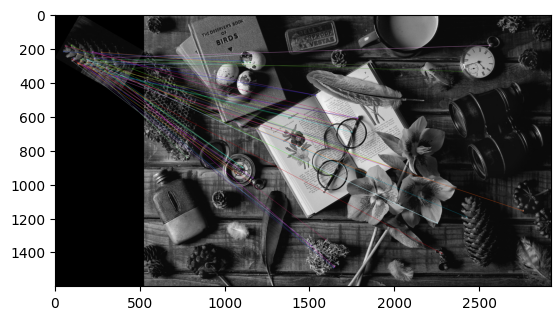

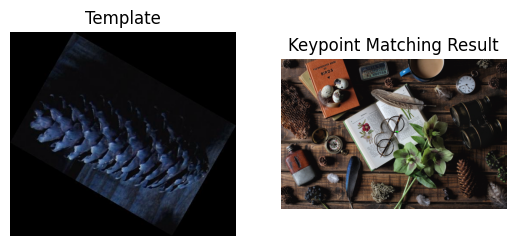

0.0


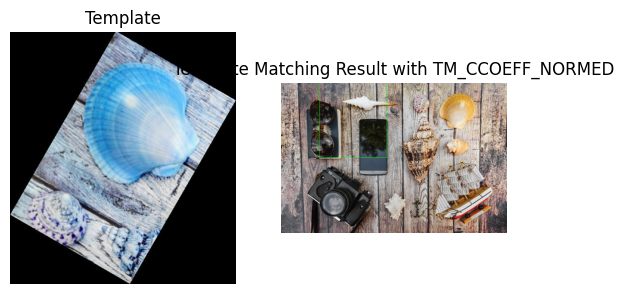

0.0


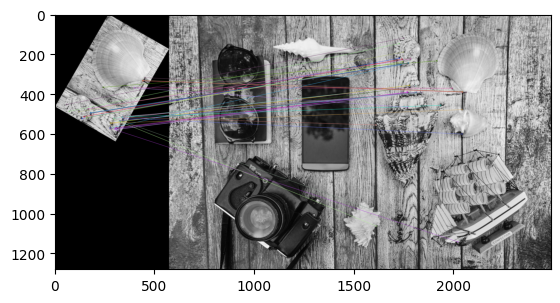

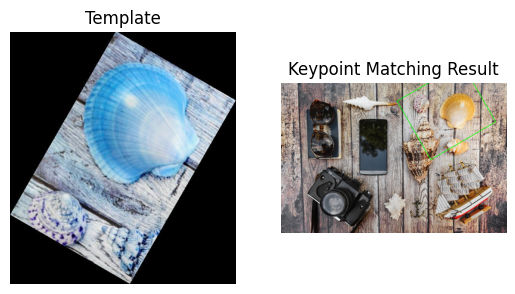

0.5138070424790387


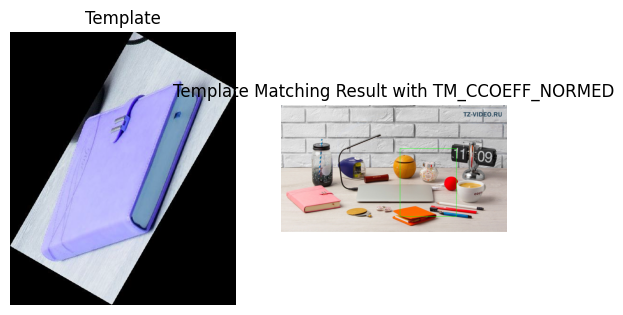

0.0


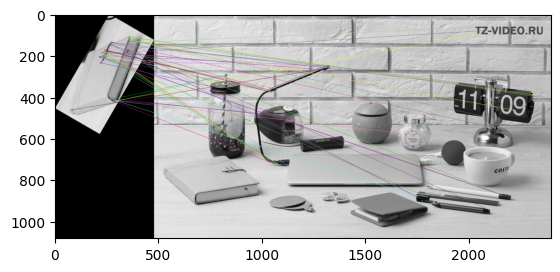

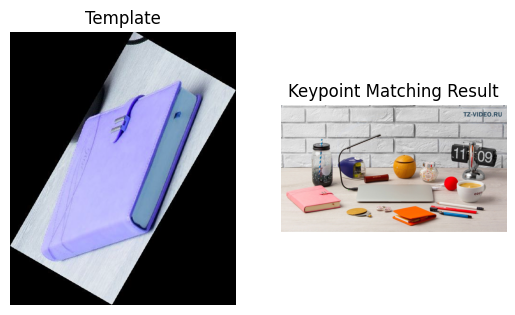

0.0


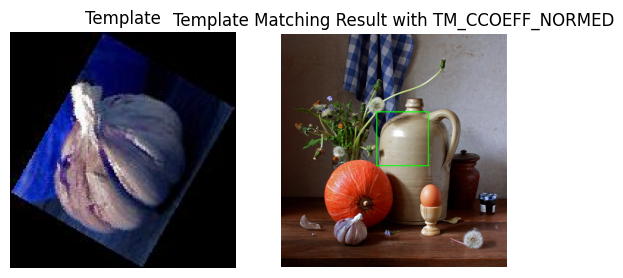

0.0


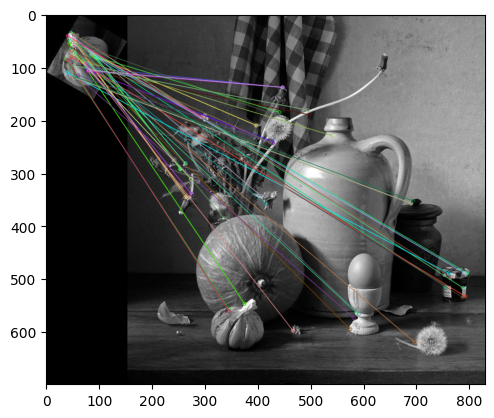

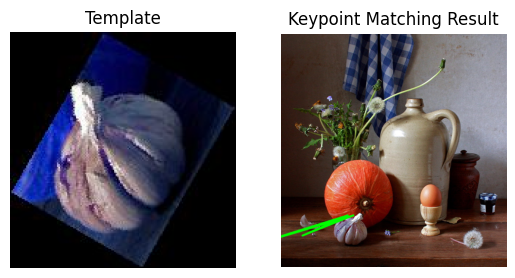

0.0


In [9]:
image_path_template = 'images\\img_detection_?.jpg'
crop_image_path_template = 'images\\crop_rotated\\img_detection_crop_?.jpg'
average_iou_template = []
average_iou_keypoint = []

for i in range (1, 11):
    image_path = image_path_template.replace('?', str(i))
    template_path = crop_image_path_template.replace('?', str(i))
    image_id = int(image_path[:-4].split('_')[-1])

    annotation_path = 'images\\annotation.csv'
    ann_map = get_annotations(annotation_path)

    pred_box = template_matching_cv(image_path, template_path)
    iou = calculate_iou(pred_box, ann_map.get(image_id))
    average_iou_template.append(iou)
    print(iou)

    pred_box = keypoint_matching(image_path, template_path)
    ann_box = convert_to_4_points(ann_map.get(image_id))
    iou = calculate_rotated_iou(pred_box, ann_box)
    average_iou_keypoint.append(iou)
    print(iou)

In [10]:
print('Average IoU for template matching:', np.mean(average_iou_template))
print('Average IoU for keypoint matching:', np.mean(average_iou_keypoint))

average_iou_template = np.array(average_iou_template)
average_iou_keypoint = np.array(average_iou_keypoint)
print('Template matching (without zero results):', average_iou_template[average_iou_template != 0].mean())
print('Keypoint matching (without zero results):', average_iou_keypoint[average_iou_keypoint != 0].mean())

print('Template matching (count of zero results):', np.count_nonzero(average_iou_template == 0.0))
print('Keypoint matching (count of zero results):', np.count_nonzero(average_iou_keypoint == 0.0))

Average IoU for template matching: 0.09845724583751357
Average IoU for keypoint matching: 0.25212442801553203
Template matching (without zero results): 0.24614311459378393
Keypoint matching (without zero results): 0.5042488560310641
Template matching (count of zero results): 6
Keypoint matching (count of zero results): 5
